<center><h1>Geng_Haoxiang_HW5</h1></center>
<br>
<br>

Name: Haoxiang Geng
<br>
Github Username: Haoxiang310
<br>
USC ID: 8045015278

## 1. Decision Trees as Interpretable Models

Import packages

In [109]:
!pip install xgboost

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import RidgeCV, LassoCV, LinearRegression
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.tree import _tree

### (a) Obtain Data

Get the Accute Inamations Data Set

In [110]:
data_path = "../data/diagnosis.csv"
data = pd.read_csv(data_path, sep='\s+', header = None, encoding='utf-16')
data[0] = data[0].str.replace(',','.').astype(float)
columns_ = ["p1", "p2", "p3", "p4", "p5", "p6", "disease1", "disease2"]
data.columns = columns_
print(data)

       p1   p2   p3   p4   p5   p6 disease1 disease2
0    35.5   no  yes   no   no   no       no       no
1    35.9   no   no  yes  yes  yes      yes       no
2    35.9   no  yes   no   no   no       no       no
3    36.0   no   no  yes  yes  yes      yes       no
4    36.0   no  yes   no   no   no       no       no
..    ...  ...  ...  ...  ...  ...      ...      ...
115  41.4   no  yes  yes   no  yes       no      yes
116  41.5   no   no   no   no   no       no       no
117  41.5  yes  yes   no  yes   no       no      yes
118  41.5   no  yes  yes   no  yes       no      yes
119  41.5   no  yes  yes   no  yes       no      yes

[120 rows x 8 columns]


### (b) Build a decision tree

Decision tree for disease1:


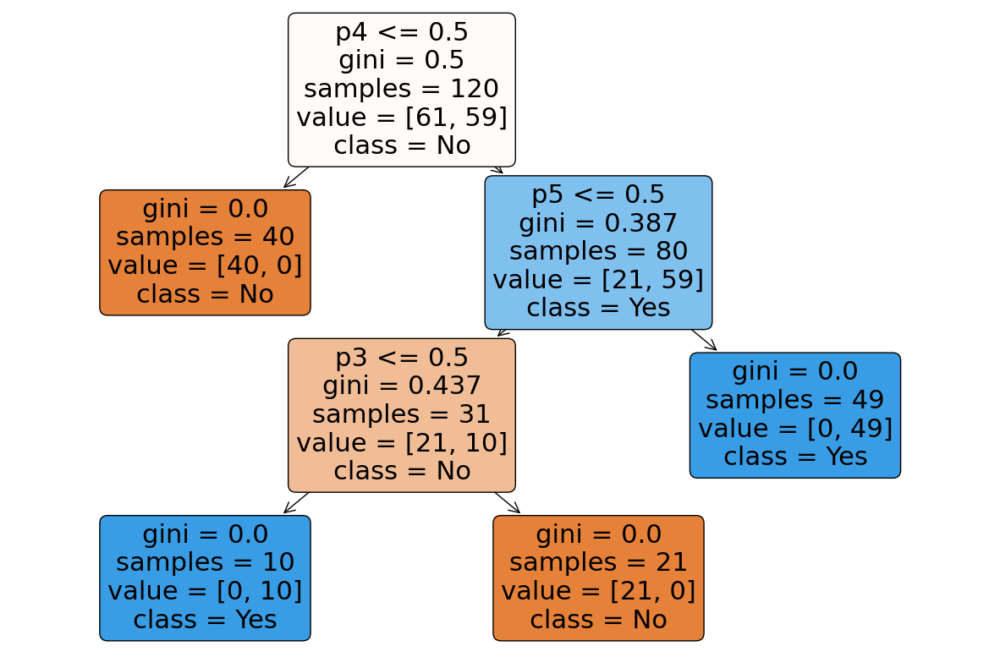

Decision tree for disease2:


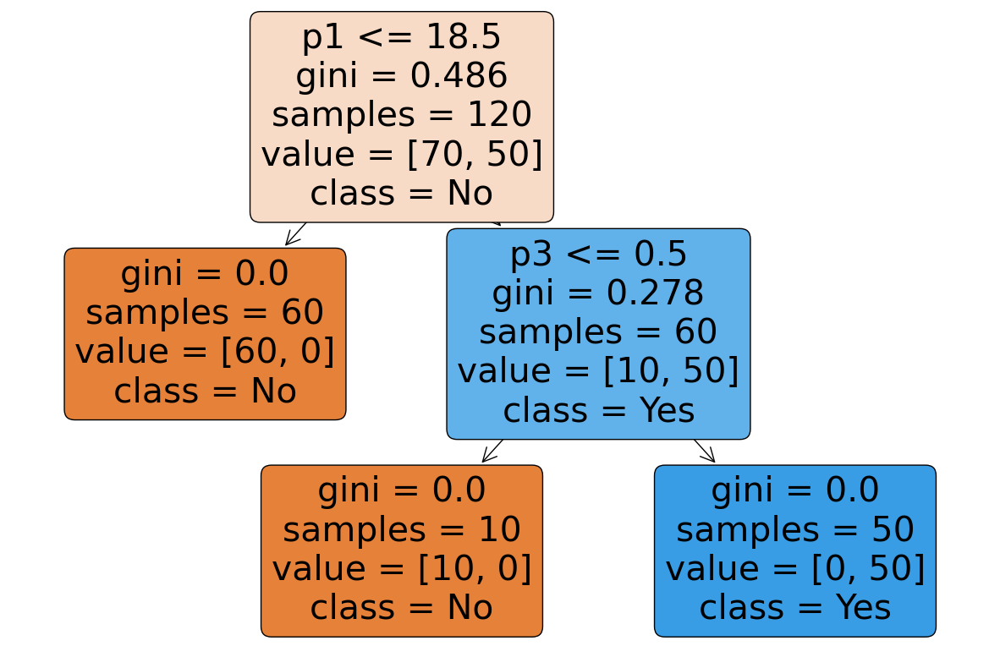

Decision tree for disease1 and disease2:


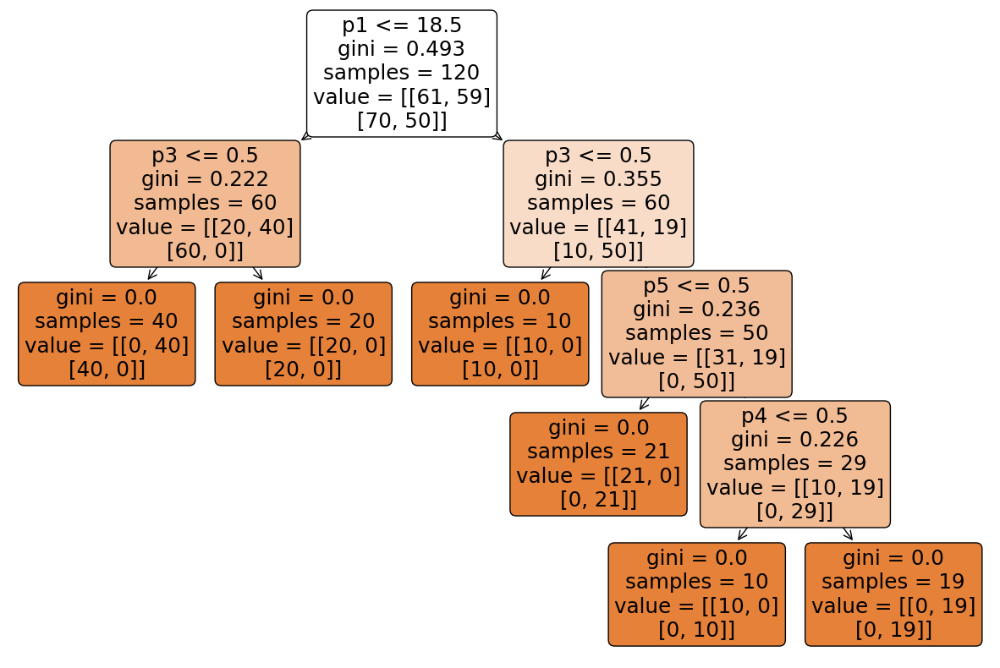

In [111]:
def get_decision_tree(X,Y):
    decision_tree = DecisionTreeClassifier()
    decision_tree.fit(X, Y)
    plt.figure(figsize=(15,10))
    plot_tree(decision_tree, filled=True, feature_names=X.columns.tolist(), class_names=['No', 'Yes'], rounded=True)
    plt.show()
    return decision_tree

label_encoders = {}
for column in data.columns:
    labelEncoder = LabelEncoder()
    data[column] = labelEncoder.fit_transform(data[column])
    label_encoders[column] = labelEncoder
    
predictors = data.drop(columns=['disease1', 'disease2'])   
disease1_target = data['disease1']
disease2_target = data['disease2']
combined_labels = data[['disease1', 'disease2']]
# print(predictors.head())
# print(disease1_target.head())
# print(disease2_target.head())
print("Decision tree for disease1:")
decision_tree_label1 = get_decision_tree(predictors, disease1_target);

print("Decision tree for disease2:")
decision_tree_label2 = get_decision_tree(predictors, disease2_target);

print("Decision tree for disease1 and disease2:")
decision_tree_label1and2 = get_decision_tree(predictors, combined_labels);


### (c) Convert the decision rules

In [112]:
def tree_to_code(tree, feature_names):
    
	tree_ = tree.tree_
	feature_name = [
		feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
		for i in tree_.feature
	]
	print("def tree({}):".format(", ".join(feature_names)))

	def recurse(node, depth):
		indent = "  " * depth
		if tree_.feature[node] != _tree.TREE_UNDEFINED:
			name = feature_name[node]
			threshold = tree_.threshold[node]
			print("{}if {} <= {}:".format(indent, name, threshold))
			recurse(tree_.children_left[node], depth + 1)
			print("{}else:  # if {} > {}".format(indent, name, threshold))
			recurse(tree_.children_right[node], depth + 1)
		else:
			print("{}return {}".format(indent, tree_.value[node]))

	recurse(0, 1)
    
print("IF_ELSE for decision of disease1:")
tree_to_code(decision_tree_label1, predictors.columns)

print("\nIF_ELSE for decision of disease2:")
tree_to_code(decision_tree_label2, predictors.columns)

print("\nIF_ELSE for decision of disease1 and disease2:")
tree_to_code(decision_tree_label1and2, predictors.columns)

IF_ELSE for decision of disease1:
def tree(p1, p2, p3, p4, p5, p6):
  if p4 <= 0.5:
    return [[40.  0.]]
  else:  # if p4 > 0.5
    if p5 <= 0.5:
      if p3 <= 0.5:
        return [[ 0. 10.]]
      else:  # if p3 > 0.5
        return [[21.  0.]]
    else:  # if p5 > 0.5
      return [[ 0. 49.]]

IF_ELSE for decision of disease2:
def tree(p1, p2, p3, p4, p5, p6):
  if p1 <= 18.5:
    return [[60.  0.]]
  else:  # if p1 > 18.5
    if p3 <= 0.5:
      return [[10.  0.]]
    else:  # if p3 > 0.5
      return [[ 0. 50.]]

IF_ELSE for decision of disease1 and disease2:
def tree(p1, p2, p3, p4, p5, p6):
  if p1 <= 18.5:
    if p3 <= 0.5:
      return [[ 0. 40.]
 [40.  0.]]
    else:  # if p3 > 0.5
      return [[20.  0.]
 [20.  0.]]
  else:  # if p1 > 18.5
    if p3 <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if p3 > 0.5
      if p5 <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if p5 > 0.5
        if p4 <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        els

### (d). Use cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability.

Best lambda for disease1: 0.0
Best max_depth for disease1: 3
Best CV score for disease1: 1.0
Test accuracy for disease1: 1.0


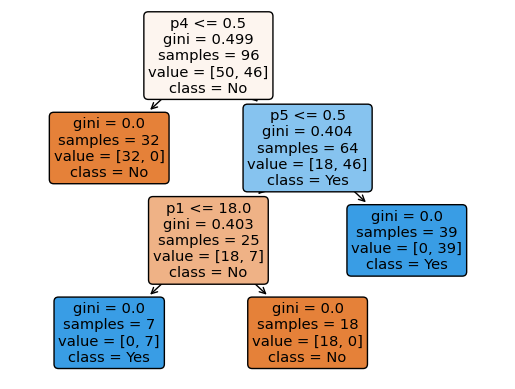

def tree(p1, p2, p3, p4, p5, p6):
  if p4 <= 0.5:
    return [[32.  0.]]
  else:  # if p4 > 0.5
    if p5 <= 0.5:
      if p1 <= 18.0:
        return [[0. 7.]]
      else:  # if p1 > 18.0
        return [[18.  0.]]
    else:  # if p5 > 0.5
      return [[ 0. 39.]]

Best lambda for disease2: 0.0
Best max_depth for disease2: 2
Best CV score for disease2: 1.0
Test accuracy for disease2: 1.0


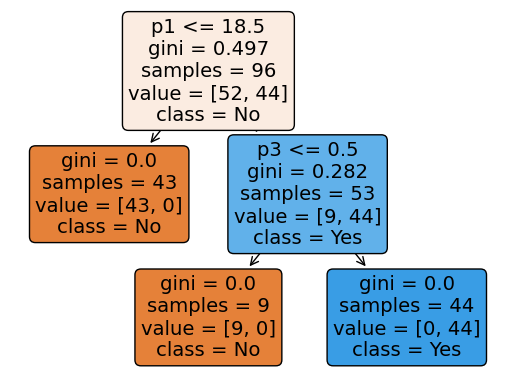

def tree(p1, p2, p3, p4, p5, p6):
  if p1 <= 18.5:
    return [[43.  0.]]
  else:  # if p1 > 18.5
    if p3 <= 0.5:
      return [[9. 0.]]
    else:  # if p3 > 0.5
      return [[ 0. 44.]]

Best lambda for combined diseases: 0.0
Best max_depth for combined diseases: 3
Best CV score for combined diseases: 0.9473684210526315
Test accuracy for combined diseases: 0.9583333333333334


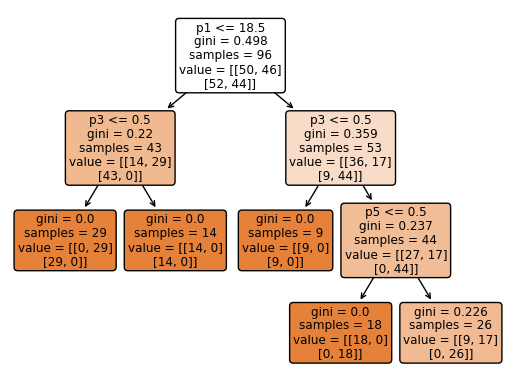

def tree(p1, p2, p3, p4, p5, p6):
  if p1 <= 18.5:
    if p3 <= 0.5:
      return [[ 0. 29.]
 [29.  0.]]
    else:  # if p3 > 0.5
      return [[14.  0.]
 [14.  0.]]
  else:  # if p1 > 18.5
    if p3 <= 0.5:
      return [[9. 0.]
 [9. 0.]]
    else:  # if p3 > 0.5
      if p5 <= 0.5:
        return [[18.  0.]
 [ 0. 18.]]
      else:  # if p5 > 0.5
        return [[ 9. 17.]
 [ 0. 26.]]


In [113]:
def plot_tree_structure(tree_classifier):
    plot_tree(tree_classifier, filled=True, feature_names=X.columns.tolist(), class_names=['No', 'Yes'], rounded=True)
    plt.show()
    return tree_classifier

def get_optimal_tree_and_metrics(X, y, depth_range):
    # Split data, 80% data for training set(cross-validation) and 20% for test set
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=50)

    path = DecisionTreeClassifier().fit(X_train, y_train).cost_complexity_pruning_path(X_train, y_train)
    lambdas = path.ccp_alphas

    param_grid = {
        'ccp_alpha': lambdas,
        'max_depth': depth_range
    }
    tree_classifier = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, scoring='accuracy')
    tree_classifier.fit(X_train, y_train)
    
    best_lambda = tree_classifier.best_params_['ccp_alpha']
    best_depth = tree_classifier.best_params_['max_depth']
    best_score_cv = tree_classifier.best_score_

    optimal_tree = DecisionTreeClassifier(ccp_alpha=best_lambda, max_depth=best_depth)
    optimal_tree.fit(X_train, y_train)
    
    test_accuracy = optimal_tree.score(X_test, y_test)

    return optimal_tree, best_lambda, best_depth, best_score_cv, test_accuracy

depth_range = range(1, 4)
tree_disease1, lambda_disease1, depth_disease1, score_cv_disease1, accuracy_disease1 = get_optimal_tree_and_metrics(predictors, disease1_target, depth_range)
print("Best lambda for disease1:", lambda_disease1)
print("Best max_depth for disease1:", depth_disease1)
print("Best CV score for disease1:", score_cv_disease1)
print("Test accuracy for disease1:", accuracy_disease1)
plot_tree_structure(tree_disease1)
tree_to_code(tree_disease1, predictors.columns)

tree_disease2, lambda_disease2, depth_disease2, score_cv_disease2, accuracy_disease2 = get_optimal_tree_and_metrics(predictors, disease2_target, depth_range)
print("\nBest lambda for disease2:", lambda_disease2)
print("Best max_depth for disease2:", depth_disease2)
print("Best CV score for disease2:", score_cv_disease2)
print("Test accuracy for disease2:", accuracy_disease2)
plot_tree_structure(tree_disease2)
tree_to_code(tree_disease2, predictors.columns)

tree_combined, lambda_combined, depth_combined, score_cv_combined, accuracy_combined = get_optimal_tree_and_metrics(predictors, combined_labels, depth_range)
print("\nBest lambda for combined diseases:", lambda_combined)
print("Best max_depth for combined diseases:", depth_combined)
print("Best CV score for combined diseases:", score_cv_combined)
print("Test accuracy for combined diseases:", accuracy_combined)
plot_tree_structure(tree_combined)
tree_to_code(tree_combined, predictors.columns)


## 2. The LASSO and Boosting for Regression

### (a) Obtain Data

In [114]:
data_path = "../data/communities.csv"
data_column_path = "../data/communities_name.csv"

def get_columns_crime_data(filename):
    columns = []
    with open(filename, 'r') as file:
        for line in file:
            if "@attribute" in line:
                columns.append(line.split(" ")[1])
    return columns

columns = get_columns_crime_data(data_column_path)
data = pd.read_csv(data_path, header=None, na_values='?')
data.columns = columns
data

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [115]:
train_df = data.iloc[:1495,:]
test_df = data.iloc[1495:, :]
print(train_df)
print(test_df)

      state  county  community        communityname  fold  population  \
0         8     NaN        NaN         Lakewoodcity     1        0.19   
1        53     NaN        NaN          Tukwilacity     1        0.00   
2        24     NaN        NaN         Aberdeentown     1        0.00   
3        34     5.0    81440.0  Willingborotownship     1        0.04   
4        42    95.0     6096.0    Bethlehemtownship     1        0.01   
...     ...     ...        ...                  ...   ...         ...   
1490      6     NaN        NaN     Hillsboroughtown     8        0.00   
1491      6     NaN        NaN           Orangecity     8        0.16   
1492     13     NaN        NaN         Waycrosscity     8        0.01   
1493     39    85.0    49056.0           Mentorcity     8        0.06   
1494     34    17.0    79610.0      WestNewYorktown     8        0.05   

      householdsize  racepctblack  racePctWhite  racePctAsian  ...  LandArea  \
0              0.33          0.02          

### (b) Missing values

In [116]:
# remove unpredictable features
data = data.iloc[:, 5:]
train_df = train_df.iloc[:, 5:]
test_df = test_df.iloc[:, 5:]
print(train_df)
print(test_df)

      population  householdsize  racepctblack  racePctWhite  racePctAsian  \
0           0.19           0.33          0.02          0.90          0.12   
1           0.00           0.16          0.12          0.74          0.45   
2           0.00           0.42          0.49          0.56          0.17   
3           0.04           0.77          1.00          0.08          0.12   
4           0.01           0.55          0.02          0.95          0.09   
...          ...            ...           ...           ...           ...   
1490        0.00           0.59          0.01          0.69          1.00   
1491        0.16           0.62          0.03          0.74          0.48   
1492        0.01           0.36          0.95          0.24          0.03   
1493        0.06           0.53          0.01          0.98          0.05   
1494        0.05           0.43          0.08          0.65          0.12   

      racePctHisp  agePct12t21  agePct12t29  agePct16t24  agePct65up  ...  

In [117]:
num_imputer = SimpleImputer(strategy="mean")
for column in train_df.select_dtypes(include=['float64', 'int64']).columns:
    train_df[column] = num_imputer.fit_transform(train_df[[column]])

print(train_df)

      population  householdsize  racepctblack  racePctWhite  racePctAsian  \
0           0.19           0.33          0.02          0.90          0.12   
1           0.00           0.16          0.12          0.74          0.45   
2           0.00           0.42          0.49          0.56          0.17   
3           0.04           0.77          1.00          0.08          0.12   
4           0.01           0.55          0.02          0.95          0.09   
...          ...            ...           ...           ...           ...   
1490        0.00           0.59          0.01          0.69          1.00   
1491        0.16           0.62          0.03          0.74          0.48   
1492        0.01           0.36          0.95          0.24          0.03   
1493        0.06           0.53          0.01          0.98          0.05   
1494        0.05           0.43          0.08          0.65          0.12   

      racePctHisp  agePct12t21  agePct12t29  agePct16t24  agePct65up  ...  

In [118]:
num_imputer = SimpleImputer(strategy="mean")
for column in test_df.select_dtypes(include=['float64', 'int64']).columns:
    test_df[column] = num_imputer.fit_transform(test_df[[column]])

print(test_df)

      population  householdsize  racepctblack  racePctWhite  racePctAsian  \
1495        0.00           0.20          0.03          0.91          0.23   
1496        0.00           0.55          0.13          0.78          0.15   
1497        0.00           0.52          0.04          0.59          0.05   
1498        0.04           0.51          0.07          0.92          0.09   
1499        0.03           0.59          0.20          0.75          0.19   
...          ...            ...           ...           ...           ...   
1989        0.01           0.40          0.10          0.87          0.12   
1990        0.05           0.96          0.46          0.28          0.83   
1991        0.16           0.37          0.25          0.69          0.04   
1992        0.08           0.51          0.06          0.87          0.22   
1993        0.20           0.78          0.14          0.46          0.24   

      racePctHisp  agePct12t21  agePct12t29  agePct16t24  agePct65up  ...  

In [119]:
num_imputer = SimpleImputer(strategy="mean")
for column in data.select_dtypes(include=['float64', 'int64']).columns:
    data[column] = num_imputer.fit_transform(data[[column]])

print(data)

      population  householdsize  racepctblack  racePctWhite  racePctAsian  \
0           0.19           0.33          0.02          0.90          0.12   
1           0.00           0.16          0.12          0.74          0.45   
2           0.00           0.42          0.49          0.56          0.17   
3           0.04           0.77          1.00          0.08          0.12   
4           0.01           0.55          0.02          0.95          0.09   
...          ...            ...           ...           ...           ...   
1989        0.01           0.40          0.10          0.87          0.12   
1990        0.05           0.96          0.46          0.28          0.83   
1991        0.16           0.37          0.25          0.69          0.04   
1992        0.08           0.51          0.06          0.87          0.22   
1993        0.20           0.78          0.14          0.46          0.24   

      racePctHisp  agePct12t21  agePct12t29  agePct16t24  agePct65up  ...  

### (c) Plot a correlation matrix

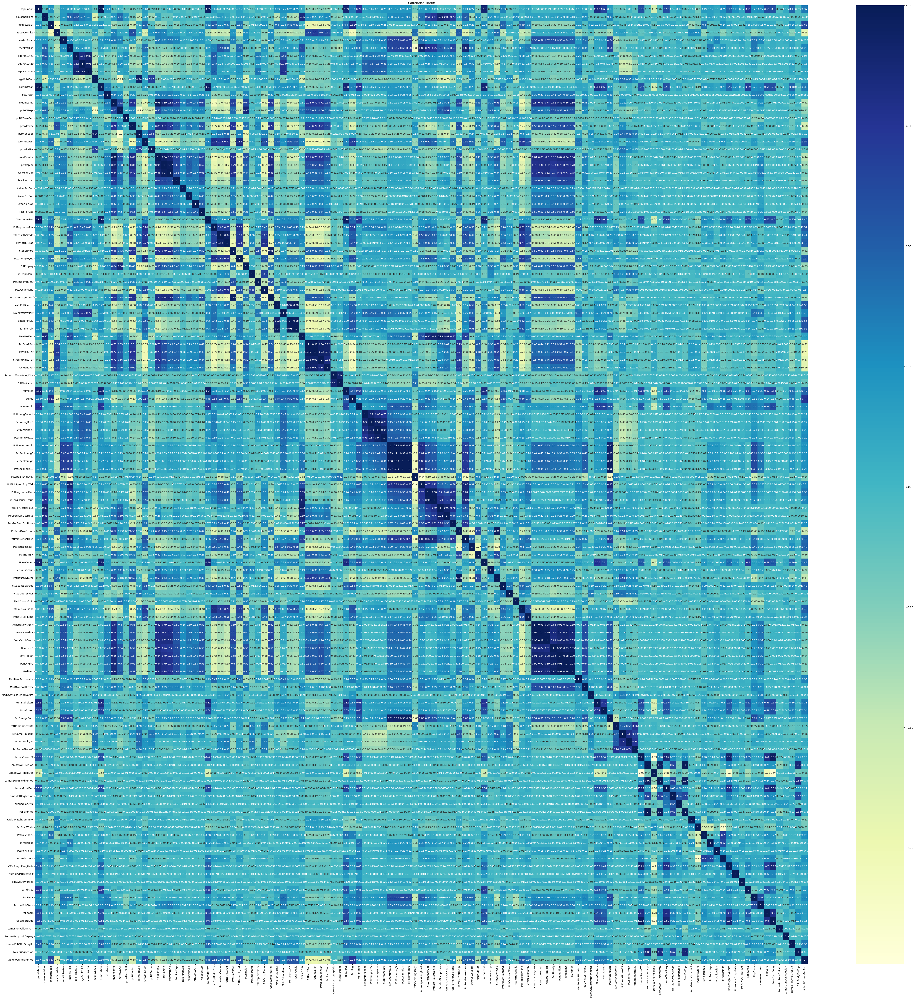

In [120]:
correlation_matrix = data.corr()
plt.figure(figsize=(70, 70))
sns.heatmap(correlation_matrix, annot=True, cmap='YlGnBu')
plt.title('Correlation Matrix')
plt.show()

### (d) Calculate the Coefficient of Variation CV

In [121]:
mean_values = data.mean()
std_values = data.std()
cv_values = std_values / mean_values
cv_df = pd.DataFrame({
    'Mean': mean_values,
    'Std': std_values,
    'CV': cv_values
})
cv_df = cv_df.transpose()
print(cv_df)

      population  householdsize  racepctblack  racePctWhite  racePctAsian  \
Mean    0.057593       0.463395      0.179629      0.753716      0.153681   
Std     0.126906       0.163717      0.253442      0.244039      0.208877   
CV      2.203503       0.353298      1.410920      0.323782      1.359162   

      racePctHisp  agePct12t21  agePct12t29  agePct16t24  agePct65up  ...  \
Mean     0.144022     0.424218     0.493867     0.336264    0.423164  ...   
Std      0.232492     0.155196     0.143564     0.166505    0.179185  ...   
CV       1.614278     0.365840     0.290693     0.495161    0.423442  ...   

      LandArea   PopDens  PctUsePubTrans  PolicCars  PolicOperBudg  \
Mean  0.065231  0.232854        0.161685   0.163103       0.076708   
Std   0.109459  0.203092        0.229055   0.085793       0.056005   
CV    1.678031  0.872187        1.416673   0.526001       0.730107   

      LemasPctPolicOnPatr  LemasGangUnitDeploy  LemasPctOfficDrugUn  \
Mean             0.698589     

### (e) Scatter plots and box plots for highest CV features

In [122]:
num_features = int(np.floor(np.sqrt(128)))
top_cv_features = cv_values.nlargest(num_features).index

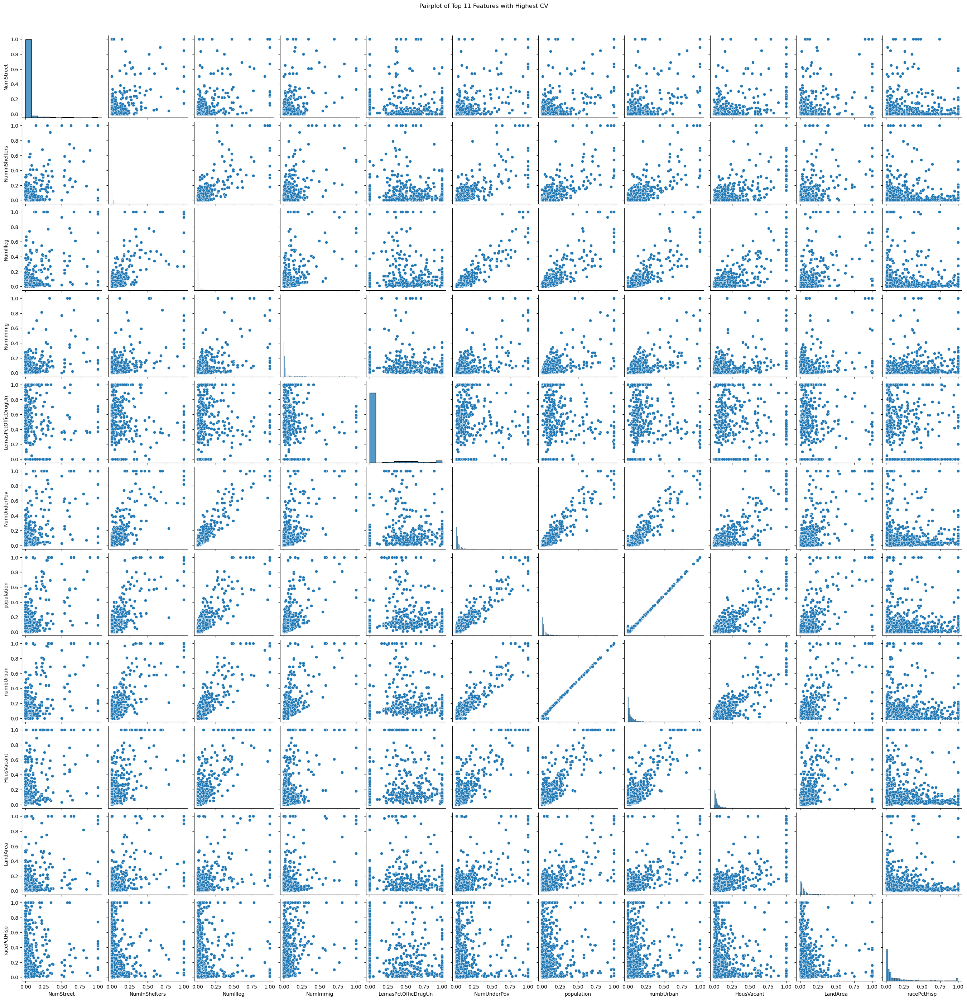

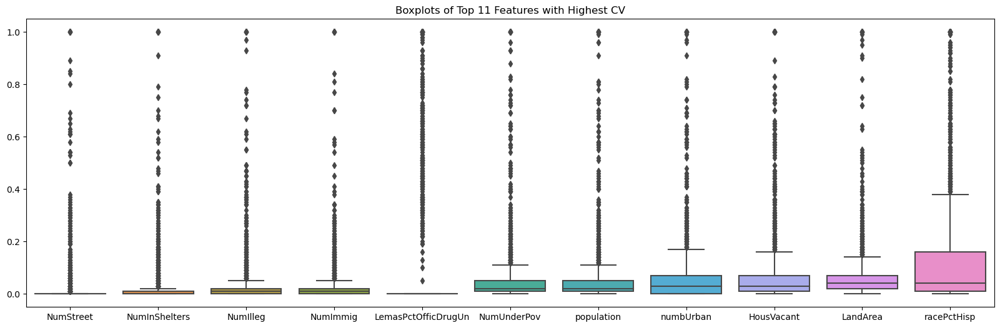

In [123]:
# Pairplot
sns.pairplot(data[top_cv_features])
plt.suptitle("Pairplot of Top 11 Features with Highest CV", y=1.02)
plt.show()

# Boxplots
plt.figure(figsize=(20, 6))
sns.boxplot(data=data[top_cv_features])
plt.title("Boxplots of Top 11 Features with Highest CV")
plt.show()

### (f) Fit a linear model

In [124]:
def evaluate_regression_model(X_train_data, y_train_data, X_test_data, y_test_data, model_label):
    X_train_with_const = sm.add_constant(X_train_data)
    regression_model = sm.OLS(y_train_data, X_train_with_const).fit()
    
    y_train_predictions = regression_model.predict(X_train_with_const)
    training_error = mean_squared_error(y_train_data, y_train_predictions)
    
    X_test_with_const = sm.add_constant(X_test_data)
    y_test_predictions = regression_model.predict(X_test_with_const)
    testing_error = mean_squared_error(y_test_data, y_test_predictions)
    
    print(f"{model_label}")
    print(f"Training Error: {training_error}")
    print(f"Testing Error: {testing_error}")
    print("\n")
    return regression_model

X_training_data = train_df.iloc[:, :-1].values
y_training_data = train_df.iloc[:, -1].values
X_testing_data = test_df.iloc[:, :-1].values
y_testing_data = test_df.iloc[:, -1].values

linear_regression_model = evaluate_regression_model(X_training_data, y_training_data, X_testing_data, y_testing_data, "Linear Regression with Statsmodels")

Linear Regression with Statsmodels
Training Error: 0.016309485245879014
Testing Error: 0.018112462026533466




### (g) Fit a ridge regression model

In [125]:
ridge_regression = RidgeCV(alphas=np.logspace(-10, 10, 21), cv=5)
ridge_regression.fit(X_training_data, y_training_data)

y_train_predictions_ridge = ridge_regression.predict(X_training_data)
training_error_ridge = mean_squared_error(y_training_data, y_train_predictions_ridge)

y_test_predictions_ridge = ridge_regression.predict(X_testing_data)
testing_error_ridge = mean_squared_error(y_testing_data, y_test_predictions_ridge)

print(f"Ridge Regression")
print(f"Optimal lambda: {ridge_regression.alpha_}")
print(f"Training Error: {training_error_ridge}")
print(f"Testing Error: {testing_error_ridge}")
print("\n")

Ridge Regression
Optimal lambda: 1.0
Training Error: 0.016694064866342517
Testing Error: 0.017723737122827796




### (h) Fit a LASSO model

In [126]:
# Lasso Regression
lasso_regression = LassoCV(alphas=np.logspace(-10, 10, 21), max_iter=10000, cv=5)
lasso_regression.fit(X_training_data, y_training_data)

y_train_predictions_lasso = lasso_regression.predict(X_training_data)
training_error_lasso = mean_squared_error(y_training_data, y_train_predictions_lasso)

y_test_predictions_lasso = lasso_regression.predict(X_testing_data)
testing_error_lasso = mean_squared_error(y_testing_data, y_test_predictions_lasso)

selected_features_lasso = train_df.columns[:-1][lasso_regression.coef_ != 0].tolist()

print(f"Lasso Regression")
print(f"Optimal lambda: {lasso_regression.alpha_}")
print(f"Training Error: {training_error_lasso}")
print(f"Testing Error: {testing_error_lasso}")
print(f"Selected features: {selected_features_lasso}")
print("\n")

# Standardized Lasso Regression
data_scaler = StandardScaler()
X_train_standardized = data_scaler.fit_transform(X_training_data)
X_test_standardized = data_scaler.transform(X_testing_data)

lasso_regression_standardized = LassoCV(alphas=np.logspace(-10, 10, 21), max_iter=10000, cv=5)
lasso_regression_standardized.fit(X_train_standardized, y_training_data)

y_train_predictions_standardized = lasso_regression_standardized.predict(X_train_standardized)
training_error_standardized = mean_squared_error(y_training_data, y_train_predictions_standardized)

y_test_predictions_standardized = lasso_regression_standardized.predict(X_test_standardized)
testing_error_standardized = mean_squared_error(y_testing_data, y_test_predictions_standardized)

selected_features_standardized = train_df.columns[:-1][lasso_regression_standardized.coef_ != 0].tolist()

print(f"Standardized Lasso Regression")
print(f"Optimal lambda: {lasso_regression_standardized.alpha_}")
print(f"Training Error: {training_error_standardized}")
print(f"Testing Error: {testing_error_standardized}")
print(f"Selected features: {selected_features_standardized}")
print("\n")

Lasso Regression
Optimal lambda: 0.0001
Training Error: 0.016879079395317464
Testing Error: 0.01776646555537783
Selected features: ['racepctblack', 'racePctAsian', 'agePct12t21', 'agePct12t29', 'agePct65up', 'pctUrban', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'PctPopUnderPov', 'PctLess9thGrade', 'PctBSorMore', 'PctEmploy', 'PctEmplManu', 'PctOccupManu', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRec10', 'PctRecImmig10', 'PctNotSpeakEnglWell', 'PctLargHouseOccup', 'PersPerOccupHous', 'PctPersOwnOccup', 'PctPersDenseHous', 'PctHousLess3BR', 'MedNumBR', 'HousVacant', 'PctHousOccup', 'PctVacantBoarded', 'PctVacMore6Mos', 'MedYrHousBuilt', 'PctHousNoPhone', 'PctWOFullPlumb', 'OwnOccLowQuart', 'RentLowQ', 'MedRent', 'MedRentPctHousInc', 'MedOw

### (i) Fit a PCR model

In [127]:
principal_component_analysis = PCA()
principal_component_regression = Pipeline([
    ('standardize_data', StandardScaler()), 
    ('principal_components', principal_component_analysis),
    ('linear_model', LinearRegression())
])
number_of_components = range(1, X_training_data.shape[1] + 1)
cross_val_scores = []

for n in number_of_components:
    principal_component_regression.set_params(principal_components__n_components=n)
    score_mean = -cross_val_score(principal_component_regression, X_training_data, y_training_data, scoring='neg_mean_squared_error', cv=5).mean()
    cross_val_scores.append(score_mean)

optimal_number_of_components = number_of_components[np.argmin(cross_val_scores)]
principal_component_regression.set_params(principal_components__n_components=optimal_number_of_components)
principal_component_regression.fit(X_training_data, y_training_data)
training_error_pcr = mean_squared_error(y_training_data, principal_component_regression.predict(X_training_data))
testing_error_pcr = mean_squared_error(y_testing_data, principal_component_regression.predict(X_testing_data))

print(f"Principal Component Regression")
print(f"Optimal M: {optimal_number_of_components}")
print(f"Training Error: {training_error_pcr}")
print(f"Testing Error: {testing_error_pcr}")

Principal Component Regression
Optimal M: 95
Training Error: 0.016655104405311844
Testing Error: 0.01833753916977863


### (j) Fit a boosting tree

In [128]:
xgb_parameters = {
    'objective': 'reg:squarederror', 
    'booster': 'gbtree', 
    'reg_alpha': 0.0, 
    'n_estimators': 1000
}

xgb_model = xgb.XGBRegressor(**xgb_parameters)
regularization_values = np.logspace(-10, 10, 21)
search_parameters = {'reg_alpha': regularization_values}
cross_val_search = GridSearchCV(xgb_model, search_parameters, scoring='neg_mean_squared_error', cv=5, verbose=1)
cross_val_search.fit(X_training_data, y_training_data)
print("Cross-validation scores for regularization values:")
for reg_value, score in zip(regularization_values, cross_val_search.cv_results_['mean_test_score']):
    print(f"Regularization Value: {reg_value}, CV Score: {-score}")

optimal_regularization = cross_val_search.best_params_['reg_alpha']
print(f"\nOptimal regularization alpha: {optimal_regularization}")
best_xgb_model = cross_val_search.best_estimator_
training_error_xgb = mean_squared_error(y_training_data, best_xgb_model.predict(X_training_data))
testing_error_xgb = mean_squared_error(y_testing_data, best_xgb_model.predict(X_testing_data))
print(f"\nL1-penalized Gradient Boosting Tree")
print(f"Training Error: {training_error_xgb}")
print(f"Testing Error: {testing_error_xgb}")
print("\n")


Fitting 5 folds for each of 21 candidates, totalling 105 fits
Cross-validation scores for regularization values:
Regularization Value: 1e-10, CV Score: 0.023876192694110655
Regularization Value: 1e-09, CV Score: 0.023876193024917232
Regularization Value: 1e-08, CV Score: 0.023876192968880793
Regularization Value: 1e-07, CV Score: 0.023876191768683774
Regularization Value: 1e-06, CV Score: 0.023814108988711898
Regularization Value: 1e-05, CV Score: 0.023819990371170597
Regularization Value: 0.0001, CV Score: 0.023644082055026182
Regularization Value: 0.001, CV Score: 0.023894958794007926
Regularization Value: 0.01, CV Score: 0.023621636088519797
Regularization Value: 0.1, CV Score: 0.02373059737688775
Regularization Value: 1.0, CV Score: 0.021595521768291954
Regularization Value: 10.0, CV Score: 0.02243326833846057
Regularization Value: 100.0, CV Score: 0.05649951301594212
Regularization Value: 1000.0, CV Score: 0.05649951301594212
Regularization Value: 10000.0, CV Score: 0.056499513015

#### References:
- https://www.kdnuggets.com/2017/05/simplifying-decision-tree-interpretation-decision-rules-python.html